CMPE 257: ML

Daniel Xinye Zhang

SJSU ID: 017471818

Date: July 28, 2024

Assignment: Project Proposal

The intention with the Project proposal is to get feedback on the viability of the final project. Please pick a topic or dataset for your project and  include your initial thoughts of what you would like to accomplish in the project (analysis notebook, web application, tutorial or lit review). If you are picking a dataset, please perform initial analysis to check data quality and questions you are interested in answering from the data.

Please do not submit your research project / Thesis as course project. It is considered a form of plagiarism.

Please DO NOT submit google document links.


# Proposal

The topic I am choosing for my project is classification and cloning using deep learning models and clustering techniques. This will be in the style of an analysis notebook.

My first goal is to create a model that can accurately classify the voice of a given person by sex through pitch. For example, I will train the model with a data set of male and female voices, and my model will be able to correctly identify the input voice to be likely male or female.

Further more, I want my model to be able to classify the voice to a target. What I'm describing is basically voice recognition, but I want to use deep learning to achieve this with as little data as posssible (5-10 second voice recording of the target variable).

Lastly, the main goal of this project would be to record the input voices and generate a cloned voice, which would essentially be accurate enough to be classified to the target variable.


Inspiration comes from:

https://www.kaggle.com/code/shashwatwork/classifying-human-voices/notebook

https://www.kaggle.com/code/fareselsalamouny/voice-recognition-classification-machine-learning/notebook

https://www.youtube.com/watch?v=ZLIPkmmDJAc

https://github.com/resemble-ai/Resemblyzer

https://www.kaggle.com/datasets/birdy654/deep-voice-deepfake-voice-recognition


**Voice Sex Classification:**

Goal: To create a model that can accurately classify the voice of a given person by sex through pitch.

Methodology: Train a deep learning model using a dataset of male and female voices. The model will analyze the pitch and other relevant features of the voice to determine the sex of the speaker. This involves preprocessing the audio data, extracting features, and training a classifier.


**Voice Recognition:**

Goal: To develop a voice recognition system that can classify a voice to a specific target with minimal data input.

Methodology: Utilize deep learning to create a model capable of recognizing and classifying a voice to a specific individual using only a short recording (5-10 seconds). This will involve training on voice datasets to capture unique voice characteristics and using advanced techniques like transfer learning to improve accuracy with limited data.


**Voice Cloning:**

Goal: To record input voices and generate a cloned voice that is accurate enough to be classified as the target variable.

Methodology: Implement a voice cloning model that can take an input voice recording and generate a synthetic voice that mimics the target voice. This involves using generative models like GANs (Generative Adversarial Networks) or autoencoders, combined with feature extraction techniques to capture the essence of the target voice. The cloned voice should be realistic and indistinguishable from the original, ensuring it can be accurately classified.

# Data Set

I will be experimenting with two data set formats.

For sex classification, I will use a csv file from kaggle that contains:



```
meanfreq: mean frequency (in kHz)

sd: standard deviation of frequency

median: median frequency (in kHz)

Q25: first quantile (in kHz)

Q75: third quantile (in kHz)

IQR: interquantile range (in kHz)

skew: skewness (see note in specprop description)

kurt: kurtosis (see note in specprop description)

sp.ent: spectral entropy

sfm: spectral flatness

mode: mode frequency

centroid: frequency centroid (see specprop)

peakf: peak frequency (frequency with highest energy)

meanfun: average of fundamental frequency measured across acoustic signal

minfun: minimum fundamental frequency measured across acoustic signal

maxfun: maximum fundamental frequency measured across acoustic signal

meandom: average of dominant frequency measured across acoustic signal

mindom: minimum of dominant frequency measured across acoustic signal

maxdom: maximum of dominant frequency measured across acoustic signal

dfrange: range of dominant frequency measured across acoustic signal

modindx: modulation index. Calculated as the accumulated absolute difference between adjacent measurements of fundamental frequencies divided by the frequency range

label: male or female
```




For voice recognition and voice cloning, I will be using audio files from LibriSpeech ASR corpus and custom audio files recorded by myself.

Details:

The LibriSpeech Audio Data set is a corpus of approximately 1000 hours of 16kHz read English speech, prepared by Vassil Panayotov with the assistance of Daniel Povey. The data is derived from read audiobooks from the LibriVox project, and has been carefully segmented and aligned.
source: https://www.openslr.org/12

I will not be using all the data in LibriSpeech but a small subset that is enough to fulfill my purposes.


# Data Quality Analysis and Preprocessing

In [10]:
from google.colab import files
voice_csv = files.upload()

Saving voice.csv to voice.csv


In [16]:
import pandas as pd
import io

# Get the filename
filename = list(voice_csv.keys())[0]

# Load the CSV file into a DataFrame
df = pd.read_csv(io.BytesIO(voice_csv[filename]))

# Display the first few rows of the DataFrame
print(df.head())

   meanfreq        sd    median       Q25       Q75       IQR       skew  \
0  0.059781  0.064241  0.032027  0.015071  0.090193  0.075122  12.863462   
1  0.066009  0.067310  0.040229  0.019414  0.092666  0.073252  22.423285   
2  0.077316  0.083829  0.036718  0.008701  0.131908  0.123207  30.757155   
3  0.151228  0.072111  0.158011  0.096582  0.207955  0.111374   1.232831   
4  0.135120  0.079146  0.124656  0.078720  0.206045  0.127325   1.101174   

          kurt    sp.ent       sfm  ...  centroid   meanfun    minfun  \
0   274.402906  0.893369  0.491918  ...  0.059781  0.084279  0.015702   
1   634.613855  0.892193  0.513724  ...  0.066009  0.107937  0.015826   
2  1024.927705  0.846389  0.478905  ...  0.077316  0.098706  0.015656   
3     4.177296  0.963322  0.727232  ...  0.151228  0.088965  0.017798   
4     4.333713  0.971955  0.783568  ...  0.135120  0.106398  0.016931   

     maxfun   meandom    mindom    maxdom   dfrange   modindx  label  
0  0.275862  0.007812  0.007812  

In [17]:
# Display basic information about the DataFrame
print(df.info())

# Display statistical summary of the DataFrame
print(df.describe())

# Check for missing values
print(df.isnull().sum())

# Display unique values for each column (useful for categorical data)
for column in df.columns:
    print(f'{column}: {df[column].unique()}')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3168 entries, 0 to 3167
Data columns (total 21 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   meanfreq  3168 non-null   float64
 1   sd        3168 non-null   float64
 2   median    3168 non-null   float64
 3   Q25       3168 non-null   float64
 4   Q75       3168 non-null   float64
 5   IQR       3168 non-null   float64
 6   skew      3168 non-null   float64
 7   kurt      3168 non-null   float64
 8   sp.ent    3168 non-null   float64
 9   sfm       3168 non-null   float64
 10  mode      3168 non-null   float64
 11  centroid  3168 non-null   float64
 12  meanfun   3168 non-null   float64
 13  minfun    3168 non-null   float64
 14  maxfun    3168 non-null   float64
 15  meandom   3168 non-null   float64
 16  mindom    3168 non-null   float64
 17  maxdom    3168 non-null   float64
 18  dfrange   3168 non-null   float64
 19  modindx   3168 non-null   float64
 20  label     3168 non-null   obje

In [19]:
# One-hot encoding for categorical variables
df = pd.get_dummies(df, drop_first=True)

In [20]:
from sklearn.preprocessing import StandardScaler

# Select numerical columns
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Standardize the numerical columns
scaler = StandardScaler()
df[numerical_columns] = scaler.fit_transform(df[numerical_columns])


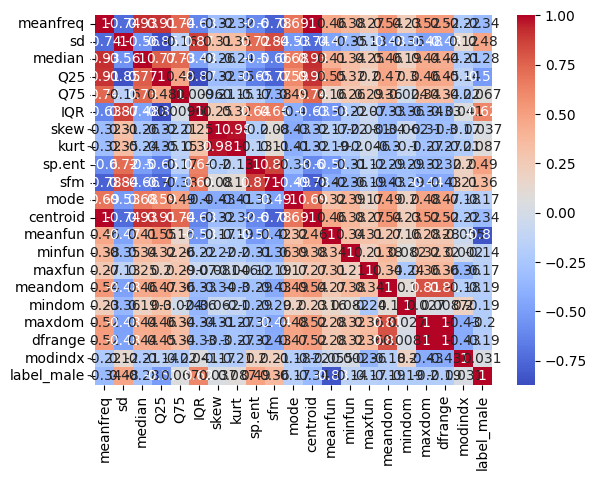

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

# Display correlation matrix
corr_matrix = df.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()


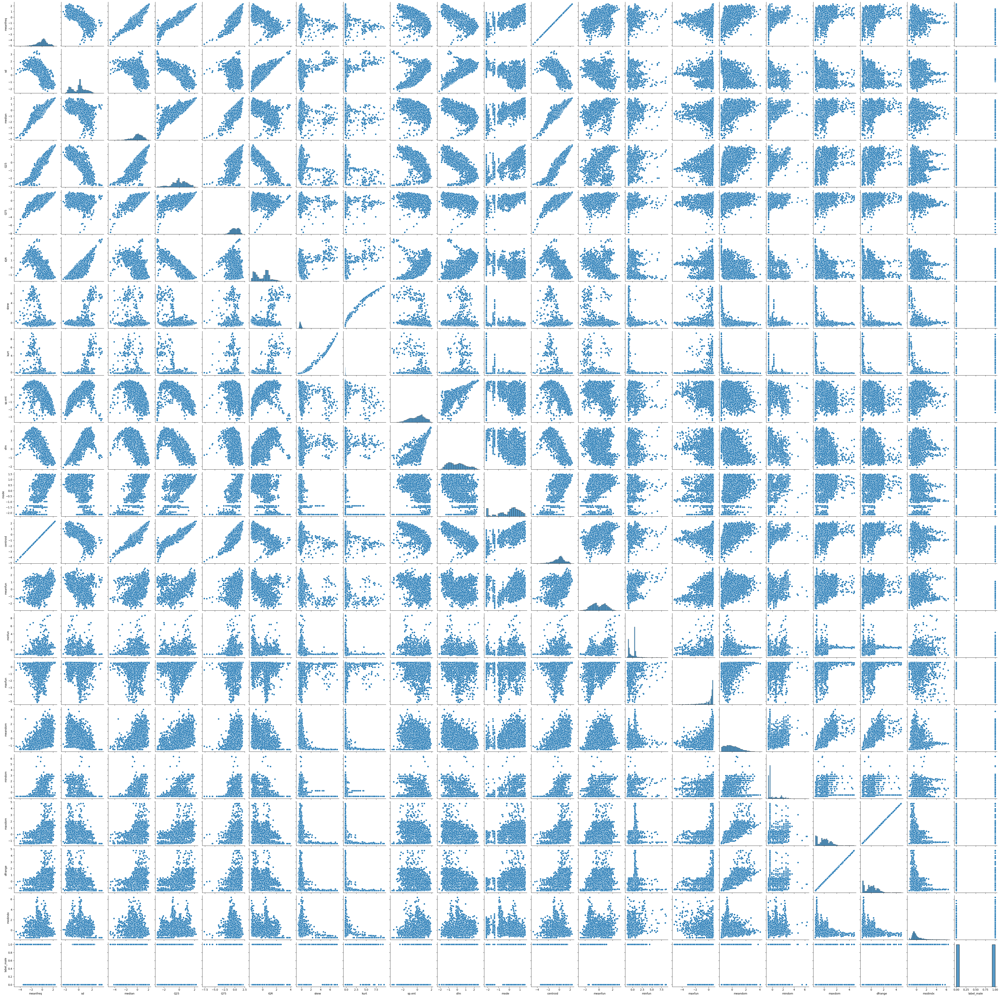

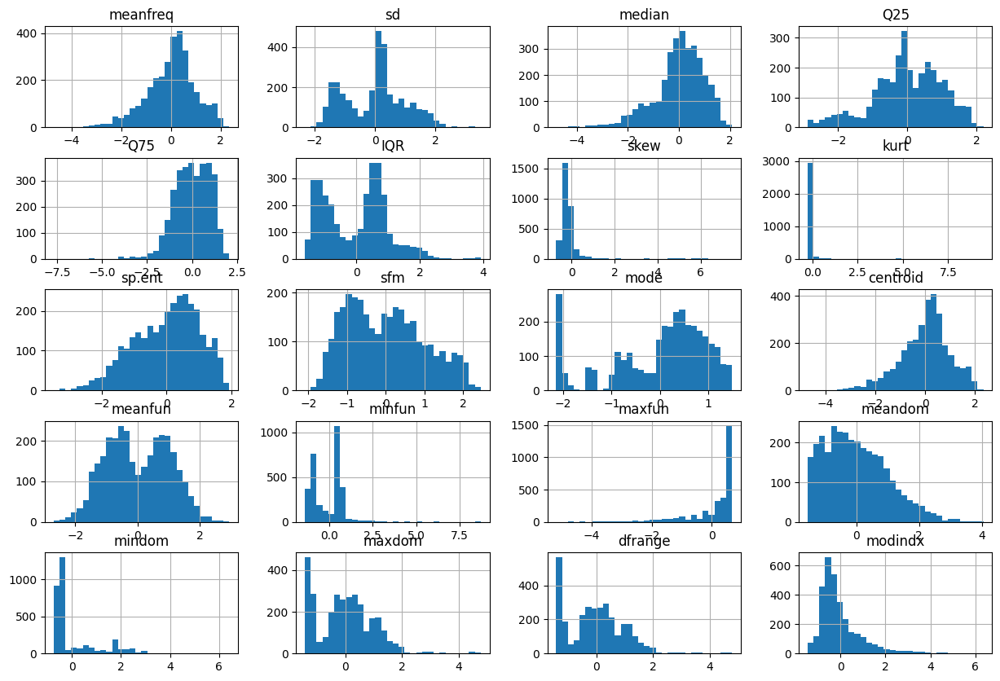

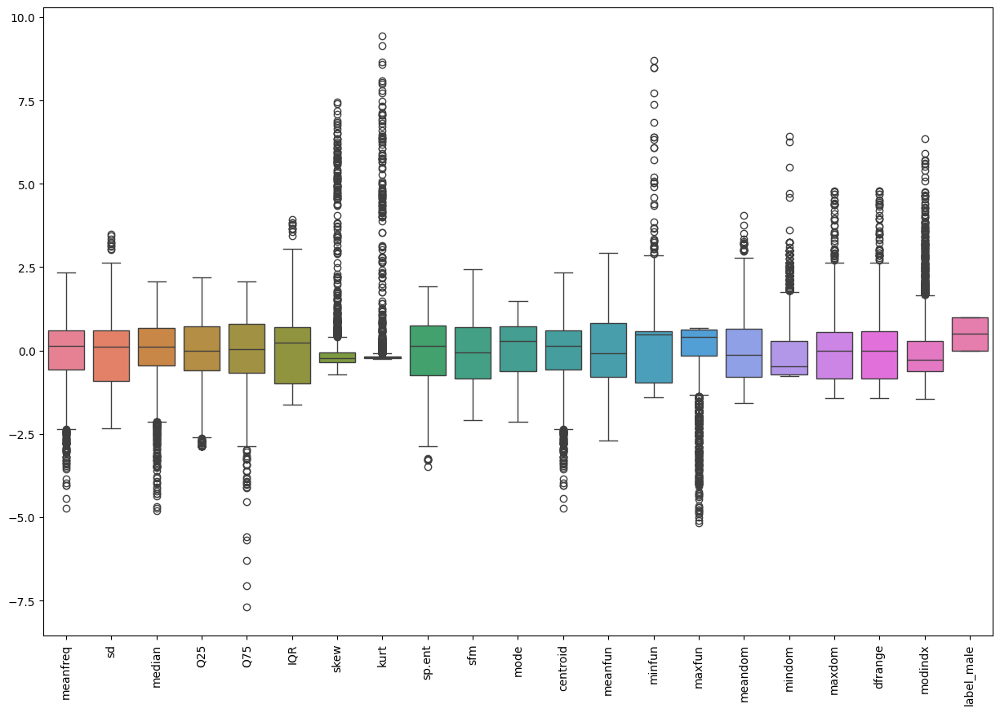

In [22]:
# Pairplot
sns.pairplot(df)
plt.show()

# Histogram for each feature
df.hist(bins=30, figsize=(15, 10))
plt.show()

# Boxplot for each feature
plt.figure(figsize=(15, 10))
sns.boxplot(data=df)
plt.xticks(rotation=90)
plt.show()

The data quality inspection shows that there were no missing values within the data set and that there was a diverse range of values for each feature.